### Importing Libraries:

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from IPython.display import display, HTML
from IPython import display

sns.set(style="whitegrid")

import warnings
warnings.filterwarnings('ignore')

### Data Gathering and Prepration:

In [2]:
df_fact= pd.read_csv('train.csv')
df_holi= pd.read_csv('holidays_events.csv')
df_oil= pd.read_csv('oil.csv')
df_stores= pd.read_csv('stores.csv')
df_transactions= pd.read_csv('transactions.csv')
df_test= pd.read_csv('test.csv')

### Dataset Information:

This competition is about time series forcasting for store sales. The data comes from an Ecuador company as known as Corporación Favorita and it is a large grocery retailer. Also, the company operates in other countries in South America.

If you wonder the company, you can click [**here**](https://www.corporacionfavorita.com/en/) to learn something about it.

<br>

<center><img src="https://github.com/EkremBayar/Kaggle/blob/main/Images/CF.png?raw=true" style="width:30%;height:10%;"></center>

<center><img src="https://github.com/EkremBayar/Kaggle/blob/main/Images/CF1.jpg?raw=true" style="width:30%;height:10%;"></center>

There are **54 stores** and **33 prodcut families** in the data. The time serie starts from **2013-01-01** and finishes in **2017-08-31**. However, you know that Kaggle gives us splitted two data as train and test. The dates in the test data are for the **15 days** after the last date in the training data. Date range in the test data will be very important to us while we are defining a cross-validation strategy and creating new features.

***Our main mission in this competition is, predicting sales for each product family and store combinations.***

There are 6 data that we will study on them step by step.
1. *Train*
2. *Test*
3. *Store*
4. *Transactions*
5. *Holidays and Events*
6. *Daily Oil Price*

**<code>The train data</code>** contains time series of the stores and the product families combination. The sales column gives the total sales for a product family at a particular store at a given date. Fractional values are possible since products can be sold in fractional units (1.5 kg of cheese, for instance, as opposed to 1 bag of chips).The onpromotion column gives the total number of items in a product family that were being promoted at a store at a given date.

**<code>Stores data</code>** gives some information about stores such as city, state, type, cluster.

**<code>Transaction data</code>** is highly correlated with train's sales column. You can understand the sales patterns of the stores.

**<code>Holidays and events data</code>** is a meta data. This data is quite valuable to understand past sales, trend and seasonality components. However, it needs to be arranged. You are going to find a comprehensive data manipulation for this data. That part will be one of the most important chapter in this notebook.

**<code>Daily Oil Price data</code>** is another data which will help us. Ecuador is an oil-dependent country and it's economical health is highly vulnerable to shocks in oil prices. That's why, it will help us to understand which product families affected in positive or negative way by oil price.

#### When you look at the data description, you will see "Additional Notes". These notes may be significant to catch some patterns or anomalies. I'm sharing them with you to remember.
- Wages in the public sector are paid every two weeks on the 15 th and on the last day of the month. Supermarket sales could be affected by this.
- A magnitude 7.8 earthquake struck Ecuador on April 16, 2016. People rallied in relief efforts donating water and other first need products which greatly affected supermarket sales for several weeks after the earthquake.

<center><h2> Let's start! </h2> </center>




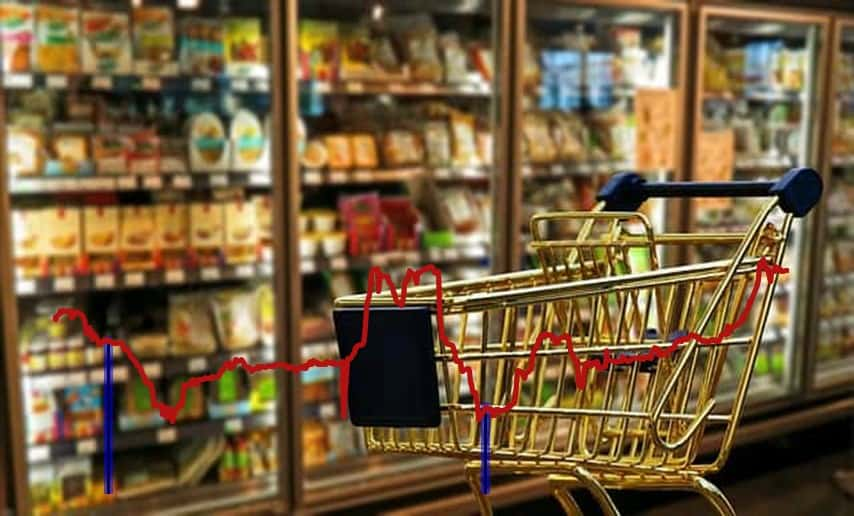


### EDA:

### Stores Analysis:

The company operates on 5 typs of stores: **<code>A,B,C,D,E</code>**

In [3]:
df_type= pd.DataFrame(df_stores.type.value_counts())

In [4]:
print('Distribution of Store Types:')
df_type.sort_values(by='type', ascending=False)

Distribution of Store Types:


,type
D,18
C,15
A,9
B,8
E,4


In [5]:
df_fact['is_prom']= df_fact['onpromotion'].apply(lambda x: 0 if x == 0 else 1)

In [6]:
df_fact['date']= pd.to_datetime(df_fact['date'])
df_fact.set_index('date',inplace=True)

df_fact['Year'] = df_fact.index.year
df_fact['Month'] = df_fact.index.month
df_fact['Day'] = df_fact.index.day
df_fact['WeekOfYear'] = df_fact.index.weekofyear

In [7]:
df_fact.columns

Index(['id', 'store_nbr', 'family', 'sales', 'onpromotion', 'is_prom', 'Year',
       'Month', 'Day', 'WeekOfYear'],
      dtype='object')

In [8]:
df_temp2= pd.merge(df_fact, df_stores, on='store_nbr', how='left')

In [9]:
df_temp2.columns

Index(['id', 'store_nbr', 'family', 'sales', 'onpromotion', 'is_prom', 'Year',
       'Month', 'Day', 'WeekOfYear', 'city', 'state', 'type', 'cluster'],
      dtype='object')

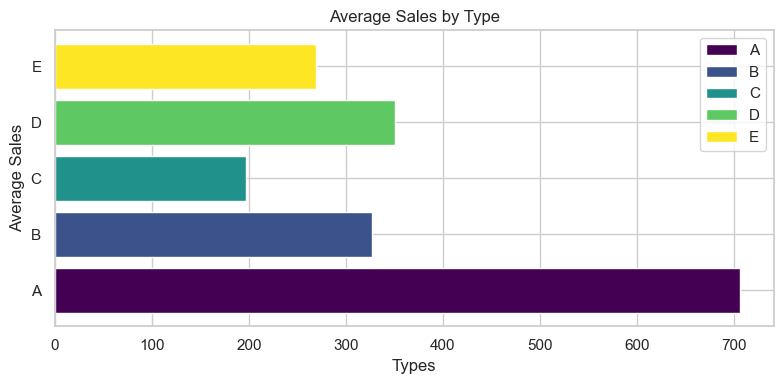

In [10]:
types = df_temp2.groupby('type').sales.mean().reset_index()['type']
sales_means = df_temp2.groupby('type').sales.mean().reset_index()['sales']

num_bars = len(types)
colors = plt.cm.viridis(np.linspace(0, 1, num_bars))  # Change the colormap as desired

plt.figure(figsize=(8, 4))  # Set figure size
bars = plt.barh(types, sales_means, color=colors)

plt.xlabel('Types')
plt.ylabel('Average Sales')
plt.title('Average Sales by Type')

plt.legend(bars, types)
plt.tight_layout()

plt.show()

Store Type **A** Gives highest daily turnover with a mean value of around 700.
Store Type **D** Brings in around 350 sales daily,
than store **B**
than store **E**
and Store Type **C** brings in least number of sales on a daily basis at around 200

##### impact of promotion on sales (By Store Type):

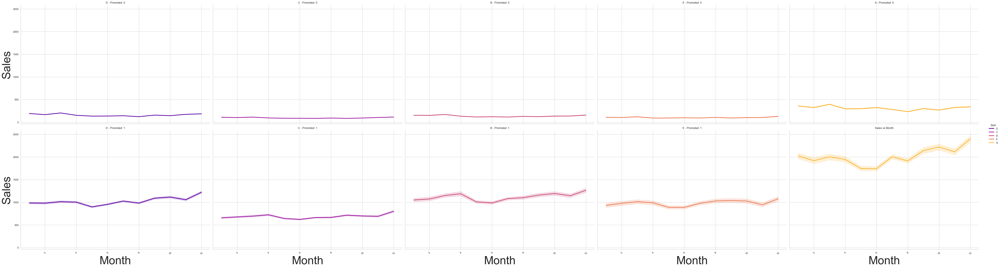

In [11]:
g = sns.relplot(
    data=df_temp2,
    x="Month",
    y="sales",
    col="type",
    hue="type",
    row="is_prom",
    palette="plasma",
    kind="line",
    height=8,  # Adjust the height of each plot
    aspect=1.5,  # Adjust the aspect ratio
    linewidth=3,  # Adjust line width
)

# Set titles and labels
g.set_axis_labels("Month", "Sales", fontsize=50)
g.set_titles("{col_name} - Promoted: {row_name}", fontsize=50)

# Rotate x-axis labels for better readability (if needed)
for ax in g.axes.flat:
    ax.tick_params(axis="x", labelrotation=45)

# Show the plot
plt.title('Sales vs Month')
plt.show()

In [12]:
df_fact.drop(columns=['is_prom'], inplace=True)

The **above plot** shows the impact of promotion on different categories of stores.

**Each plot is a month indexed time series representing sales amount on y-axis**. It is clear that the sales every year, tend to increase in December.

**It is clear that promotion plays an important role in forcasting the sales**

Spearman Correlation between Total Sales and Transactions: 0.8175


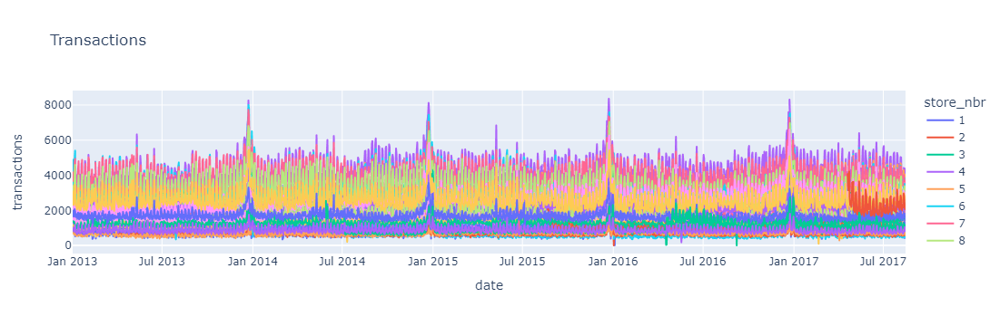

In [13]:
df_y= df_fact.reset_index()
df_y['date']= df_y['date'].astype(str)

df_temp= pd.merge(df_y.groupby(['date','store_nbr']).sales.sum().reset_index(), df_transactions, how='left')
df_temp['avg_purchase_price']= df_temp['sales']/df_temp['transactions']
df_temp = pd.merge(df_temp, df_stores, on='store_nbr')

print("Spearman Correlation between Total Sales and Transactions: {:,.4f}".format(df_temp.corr("spearman").sales.loc["transactions"]))
px.line(df_transactions.sort_values(["store_nbr", "date"]), x='date', y='transactions', color='store_nbr',title = "Transactions" )

**Missing Values:**

Analysing individual sales from above plot, it was found that some stores have missing data, or maybe some stores were opened in between the timeline:

1. Store 20--> (start: Feb-13-2015)
2. Store 21--> (start: Jul-25-2015)
3. Store 24--> (Aril-13-2014: Jul-24-2014)
4. Store 25--> (Aug-21-2016: Oct-27-2016)
5. Store 29--> (start: Mar-20-2015)
6. Store 36--> (start: May-09-2013)
7. Store 42--> (start: Aug-21-2015)
8. Store 52--> (start: Apr-22-2017)
9. Store 53--> (start: May-29-2014)

**The data in the dataset ranges from 2013-01-01 and finishes in 2017-08-31,** the above plot summarizes the #dailytransactions behaviour in the date range for all the 54 stores.

There is some obvious seasonality in the dataset, every year the sales peak at the end of the year.


**-->There is a high correlation between #transactions and sales.**

In [14]:
df_temp

,date,store_nbr,sales,transactions,avg_purchase_price,city,state,type,cluster
0,2013-01-01,1,0.000000,NaN,NaN,Quito,Pichincha,D,13
1,2013-01-02,1,7417.148000,2111.0,3.513571,Quito,Pichincha,D,13
2,2013-01-03,1,5873.244001,1833.0,3.204170,Quito,Pichincha,D,13
3,2013-01-04,1,5919.879001,1863.0,3.177605,Quito,Pichincha,D,13
4,2013-01-05,1,6318.785010,1509.0,4.187399,Quito,Pichincha,D,13
...,...,...,...,...,...,...,...,...,...
90931,2017-08-11,54,8513.834000,768.0,11.085721,El Carmen,Manabi,C,3
90932,2017-08-12,54,9139.678002,903.0,10.121460,El Carmen,Manabi,C,3
90933,2017-08-13,54,14246.827996,1054.0,13.516915,El Carmen,Manabi,C,3
90934,2017-08-14,54,11882.994000,818.0,14.526888,El Carmen,Manabi,C,3


In [15]:
df_temp['date']= pd.to_datetime(df_temp['date'])
df_temp.set_index('date',inplace=True)
df_temp['Year'] = df_temp.index.year
df_temp['Month'] = df_temp.index.month
df_temp['Day'] = df_temp.index.day
df_temp['WeekOfYear'] = df_temp.index.weekofyear

In [16]:
df_avg_price_by_store= df_temp.groupby('type').avg_purchase_price.describe().reset_index()
df_avg_price_by_store= df_avg_price_by_store.sort_values(by='mean',ascending=False)
df_avg_price_by_store[['type','mean','count','std','min','max']]

,type,mean,count,std,min,max
4,E,8.554384,5774.0,2.464589,2.799626,20.386790
0,A,8.176185,13534.0,2.916742,2.735705,38.908648
3,D,7.679022,28553.0,18.660579,2.359220,2770.951000
1,B,7.310650,11609.0,2.835790,1.994896,79.430534
2,C,6.618681,24018.0,2.328626,2.569531,81.695290


**The above table shows the statistics of **<code>average purchase value</code>** on a daily basis grouped by category of stores.**

It is evident that **<code>Store C</code>** has the least avergae purchase value;

**<code>Store D</code>** deals in high value orders too, with its max avg purchase value being ~2.8k

In [17]:
df_stores.columns

Index(['store_nbr', 'city', 'state', 'type', 'cluster'], dtype='object')

### Products Analysis:

**The company deals in 33 Categories of products**, the distribution of products by store type is shown below:

In [18]:
df_product= pd.merge(df_fact, df_stores, on='store_nbr', how='left')
grouped_data = df_product.groupby(['type', 'family']).sum().reset_index()

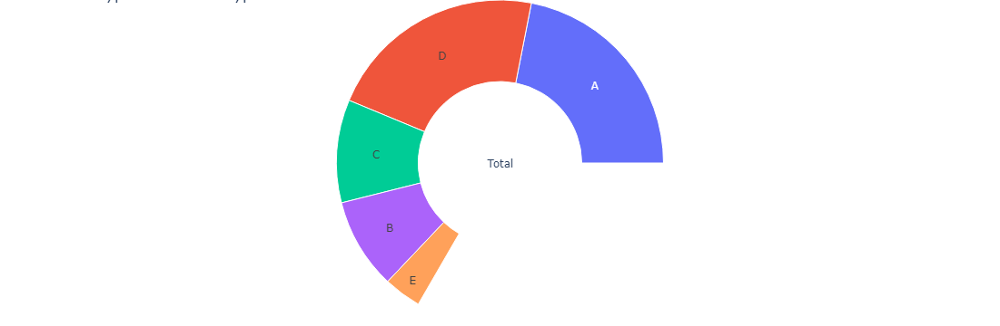

In [19]:
# Create lists for Sunburst plot
ids = []
labels = []
parents = []
values = []

# Adding root
ids.append('Total')
labels.append('Total')
parents.append('')
values.append(grouped_data['sales'].sum())

# Adding type
for store in grouped_data['type'].unique():
    ids.append(store)
    labels.append(store)
    parents.append('Total')
    values.append(grouped_data[grouped_data['type'] == store]['sales'].sum())

    # Adding family
    family_data = grouped_data[grouped_data['type'] == store]
    for index, row in family_data.iterrows():
        ids.append(store + '-' + row['family'])
        labels.append(row['family'])
        parents.append(store)
        values.append(row['sales'])

# Creating the Sunburst plot with maxdepth set to 2 for full circle expansion
fig = go.Figure(go.Sunburst(ids=ids, labels=labels, parents=parents, values=values, maxdepth=2))

# Updating layout for better view
fig.update_layout(title='Store Type vs Product Type with Sales', margin=dict(t=0, l=0, r=0, b=0))

# Show the plot
fig.show()

### Holiday Analysis:

### Oil Analysis:

In [20]:
df_oil.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


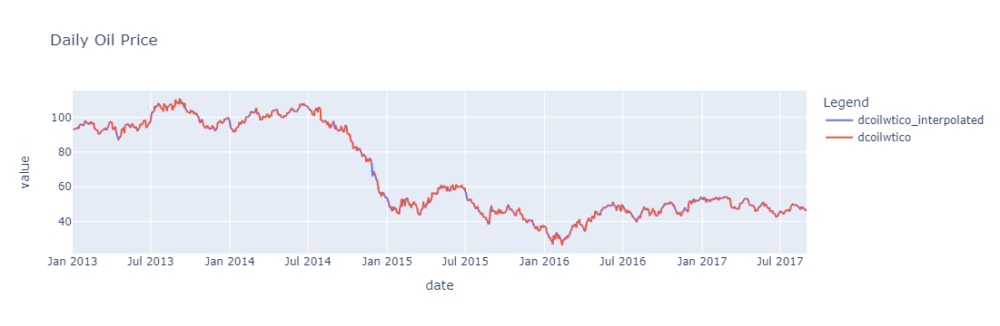

In [21]:
df_oil["date"] = pd.to_datetime(df_oil.date)
# Resample
df_oil = df_oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()
# Interpolate
df_oil["dcoilwtico"] = np.where(df_oil["dcoilwtico"] == 0, np.nan, df_oil["dcoilwtico"])
df_oil["dcoilwtico_interpolated"] =df_oil.dcoilwtico.interpolate()
# Plot
p = df_oil.melt(id_vars=['date']+list(df_oil.keys()[5:]), var_name='Legend')
px.line(p.sort_values(["Legend", "date"], ascending = [False, True]), x='date', y='value', color='Legend',title = "Daily Oil Price" )

Correlation with Daily Oil Prices
sales          -0.303237
transactions    0.040105
Name: dcoilwtico_interpolated, dtype: float64 



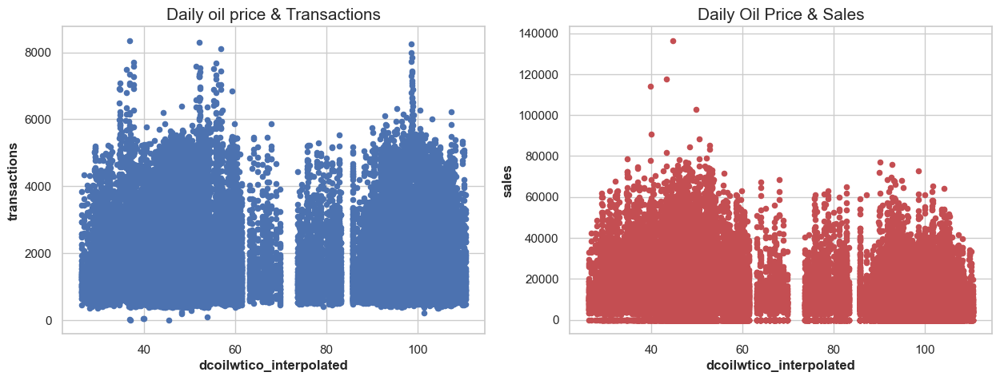

In [22]:
df_temp.reset_index(inplace=True)
df_temp = pd.merge(df_temp, df_oil, how = "left")
print("Correlation with Daily Oil Prices")
print(df_temp.drop(["store_nbr", "dcoilwtico"], axis = 1).corr("spearman").dcoilwtico_interpolated.loc[["sales", "transactions"]], "\n")


fig, axes = plt.subplots(1, 2, figsize = (15,5))
df_temp.plot.scatter(x = "dcoilwtico_interpolated", y = "transactions", ax=axes[0])
df_temp.plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[1], color = "r")
axes[0].set_title('Daily oil price & Transactions', fontsize = 15)
axes[1].set_title('Daily Oil Price & Sales', fontsize = 15);